In [1]:
 import os
import sys
import numpy as np
import re
import cv2

import matplotlib.pyplot as plt
import tensorflow as tf
from os import listdir
from tensorflow.keras.layers import *
from time import time
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.losses import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras import Model
from tensorflow.keras import initializers
from tensorflow.keras import regularizers
from tensorflow.keras import constraints
from tensorflow.keras.callbacks import *
from tensorflow.keras.applications.xception import Xception

C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


In [ ]:
import cv2
import numpy as np

def load_dataset(X1_paths, X2_paths, Y_paths, img_size=(512, 512)):
    X1 = []
    X2 = []
    Y  = []

    for p1, p2, pl in zip(X1_paths, X2_paths, Y_paths):
        img1 = cv2.imread(p1)
        img2 = cv2.imread(p2)

        label = cv2.imread(pl, cv2.IMREAD_GRAYSCALE)

        img1 = cv2.resize(img1, img_size)
        img2 = cv2.resize(img2, img_size)
        label = cv2.resize(label, img_size, interpolation=cv2.INTER_NEAREST)

        img1 = img1.astype(np.float32) / 255.0
        img2 = img2.astype(np.float32) / 255.0

        label = (label > 127).astype(np.uint8)

        label_onehot = np.zeros((*img_size, 2), dtype=np.float32)
        label_onehot[..., 0] = (label == 0) 
        label_onehot[..., 1] = (label == 1) 

        X1.append(img1)
        X2.append(img2)
        Y.append(label_onehot)

    X1 = np.stack(X1, axis=0)
    X2 = np.stack(X2, axis=0)
    Y  = np.stack(Y, axis=0)

    return X1, X2, Y


In [ ]:
import os
import cv2
import numpy as np
import glob


train_A_folder = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\train\A_resized"
train_B_folder = "D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/train/B_resized"
train_label_folder = "D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/train/label_resized"
train_A_paths = sorted(glob.glob(os.path.join(train_A_folder, "*.png")))
train_B_paths = sorted(glob.glob(os.path.join(train_B_folder, "*.png")))
train_label_paths = sorted(glob.glob(os.path.join(train_label_folder, "*.png")))

test_A_folder = r"D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/test/A_resized"
test_B_folder = r"D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/test/B_resized"
test_L_folder = r"D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/test/label_resized"
test_A_paths = sorted(glob.glob(os.path.join(test_A_folder, "*.[pP][nN][gG]")))
test_B_paths = sorted(glob.glob(os.path.join(test_B_folder, "*.[pP][nN][gG]")))
test_L_paths = sorted(glob.glob(os.path.join(test_L_folder, "*.[pP][nN][gG]")))

validation_A_folder = r"D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/val/A_resized"
validation_B_folder = r"D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/val/B_resized"
validation_L_folder = r"D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD/val/label_resized"
validation_A_paths = sorted(glob.glob(os.path.join(test_A_folder, "*.[pP][nN][gG]")))
validation_B_paths = sorted(glob.glob(os.path.join(test_B_folder, "*.[pP][nN][gG]")))
validation_L_paths = sorted(glob.glob(os.path.join(test_L_folder, "*.[pP][nN][gG]")))

X1_train, X2_train, y_train = load_dataset(train_A_paths, train_B_paths, train_label_paths)
X1_val, X2_val, y_val = load_dataset(test_A_paths, test_B_paths, test_L_paths)
X1_test,X2_test,y_test=load_dataset(validation_A_paths,validation_B_paths,validation_L_paths)

y_train_bin = y_train[..., 1:2]
y_val_bin = y_val[..., 1:2]
y_test_bin = y_test[..., 1:2]
# train_generator = simple_data_generator(train_A_paths, train_B_paths, train_label_paths, batch_size=1, augment=True)
# val_generator   = simple_data_generator(test_A_paths, test_B_paths, test_L_paths, batch_size=1, augment=False)


In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

inputshape=(512,512,3)
t1=Input(shape=inputshape)
t2=Input(shape=inputshape)

def attention_encoder_block(input1, input2, filters):
    conv1 = Conv2D(filters, kernel_size=3, padding='same', kernel_initializer='he_normal')
    conv2 = Conv2D(filters, kernel_size=3, padding='same', kernel_initializer='he_normal')
    conv3 = Conv2D(filters, kernel_size=3, padding='same', kernel_initializer='he_normal')
    pw_conv = Conv2D(1, kernel_size=1, padding='same', kernel_initializer='he_normal')

    x1_1 = conv1(input1)
    x1_1 = BatchNormalization()(x1_1)
    x1_1 = Activation('relu')(x1_1)

    x2_1 = conv1(input2)
    x2_1 = BatchNormalization()(x2_1)
    x2_1 = Activation('relu')(x2_1)

    x1_2 = conv2(x1_1)
    x1_2 = BatchNormalization()(x1_2)
    x1_2 = Activation('relu')(x1_2)

    x2_2 = conv2(x2_1)
    x2_2 = BatchNormalization()(x2_2)
    x2_2 = Activation('relu')(x2_2)

    x1_3 = conv3(x1_2)
    x1_3 = BatchNormalization()(x1_3)
    x1_3 = Activation('relu')(x1_3)

    x2_3 = conv3(x2_2)
    x2_3 = BatchNormalization()(x2_3)
    x2_3 = Activation('relu')(x2_3)

    diff = tf.math.abs(x1_3 - x2_3)

    diff_mean = tf.reduce_mean(diff, axis=-1, keepdims=True)

    sigma = pw_conv(diff_mean)
    sigma = Activation('sigmoid')(sigma)

    x1_mul= Multiply()([x1_3, sigma])
    x2_mul= Multiply()([x2_3,sigma])
    
    outI1 = Concatenate(axis=-1)([x1_1, x1_mul])
    outI2= Concatenate(axis=-1)([x2_1, x2_mul])
    return outI1, outI2

I11,I21 = attention_encoder_block(t1, t2, filters=16)
I12,I22 = attention_encoder_block(I11,I21, filters=16)
E11,E21 = attention_encoder_block(I12,I22, filters=16)
pool11 = MaxPooling2D(pool_size=(2, 2))(E11)
pool21 = MaxPooling2D(pool_size=(2, 2))(E21)
I31, I32 = attention_encoder_block(pool11, pool21, filters=32)
I41, I42 = attention_encoder_block(I31, I32, filters=32)
E12, E22 = attention_encoder_block(I41, I42, filters=32)
pool12 = MaxPooling2D(pool_size=(2, 2))(E12)
pool22 = MaxPooling2D(pool_size=(2, 2))(E22)
I51, I52 = attention_encoder_block(pool12, pool22, filters=64)
E13, E23 = attention_encoder_block(I51, I52, filters=64)
pool3 = MaxPooling2D(pool_size=(2, 2))(E23)
up1 = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same', activation='relu')(pool3)



In [ ]:
def pooling_block(x1,x2,pool_size=2):
    p1 = AveragePooling2D(pool_size=pool_size, strides=pool_size, padding='same')(x1)
    p1 = Conv2D(16, 1, padding='same')(p1)
    p1 = BatchNormalization()(p1)
    p1 = Activation('relu')(p1)

    p2 = AveragePooling2D(pool_size=pool_size, strides=pool_size, padding='same')(x2)
    p2 = Conv2D(16, 1, padding='same')(p2)
    p2 = BatchNormalization()(p2)
    p2 = Activation('relu')(p2)
    
    summed = tf.keras.layers.Add()([p1, p2])
    gap = GlobalAveragePooling2D()(summed)
    gap = Dense(16, activation='relu')(gap)
    gap = Reshape((1, 1, 16))(gap)  
    scaled = Multiply()([summed, gap])
    return scaled

def mnspp2(E11, E21, E12, E22):
    gap1 = pooling_block(E11, E21, pool_size=4) 
    gap2 = pooling_block(E12, E22, pool_size=2) 

    fnew = Concatenate(axis=-1)([gap1, gap2])   

    E12_ds = AveragePooling2D(pool_size=2)(E12) 
    E22_ds = AveragePooling2D(pool_size=2)(E22) 

    feat = Concatenate(axis=-1)([fnew, E12_ds, E22_ds])
    feat=UpSampling2D(size=(2, 2), interpolation='bilinear')(feat)
    return feat



def mnspp1(E11, E21):
    gap1 = pooling_block(E11, E21, pool_size=2)        

    E11_ds = AveragePooling2D(pool_size=2)(E11)       
    E21_ds = AveragePooling2D(pool_size=2)(E21)        

    feat = Concatenate(axis=-1)([gap1, E11_ds, E21_ds]) 
    feat=UpSampling2D(size=(2, 2), interpolation='bilinear')(feat)
    return feat


def mnspp3(E11, E21, E12, E22, E13, E23):
    gap1 = pooling_block(E11, E21, pool_size=4)    
    gap2 = pooling_block(E12, E22, pool_size=2)    
    gap3 = pooling_block(E13, E23, pool_size=1)    

    fnew = Concatenate(axis=-1)([gap1, gap2, gap3])  
    feat = Concatenate(axis=-1)([fnew, E13, E23]) 
    return feat 


mnsp3=mnspp3(E11,E21,E12,E22,E13,E23)
mnsp2=mnspp2(E11,E21,E12,E22)
mnsp1=mnspp1(E11,E21)

from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Add, Multiply, Reshape, GlobalAveragePooling2D, Concatenate

def attention_decoder_block(x, filters):
    x1 = Conv2D(filters, 3, padding='same', kernel_initializer='he_normal')(x)
    x1 = BatchNormalization()(x1)
    x1 = Activation('relu')(x1)

    x2 = Conv2D(filters, 3, padding='same', kernel_initializer='he_normal')(x1)
    x2 = BatchNormalization()(x2)
    x2 = Activation('relu')(x2)

    x3 = Conv2D(filters, 3, padding='same', kernel_initializer='he_normal')(x2)
    x3 = BatchNormalization()(x3)
    x3 = Activation('relu')(x3)
    
    channel_avg = Conv2D(1, kernel_size=1, padding='same', use_bias=False, kernel_initializer='ones')(x3)
    channel_avg = Activation('linear')(channel_avg) 
    attn_mask = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')(channel_avg)
    x3_attended = Add()([x3, attn_mask])
    out = Concatenate(axis=-1)([x1, x3_attended])
    return out
conct1=Concatenate(axis=-1)([up1,mnsp3])
decod11=attention_decoder_block(conct1,64)
decod12=attention_decoder_block(decod11,64)
up2=Conv2DTranspose(32, kernel_size=3, strides=2, padding='same', activation='relu')(decod12)

conct2=Concatenate(axis=-1)([up2,mnsp2])
decod21=attention_decoder_block(conct2,32)
decod22=attention_decoder_block(decod21,32)
decod23=attention_decoder_block(decod22,32)
up3=Conv2DTranspose(16, kernel_size=3, strides=2, padding='same', activation='relu')(decod23)

conct3=Concatenate(axis=-1)([up3,mnsp1])
decod31=attention_decoder_block(conct3,16)
decod32=attention_decoder_block(decod31,16)
decod33=attention_decoder_block(decod32,16)

output = Conv2D(2, kernel_size=1, padding='same', kernel_initializer='he_normal')(decod33)
output = Activation('softmax')(output)
model = Model(inputs=[t1, t2], outputs=output)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 16) 448         input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 512, 512, 16) 64          conv2d[1][0]                 

In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K

def wcceloss(y_true, y_pred):
    weights = tf.constant([0.5, 2.5], dtype=tf.float32) 
    y_pred = y_pred / tf.reduce_sum(y_pred, axis=-1, keepdims=True)
    y_pred = tf.clip_by_value(y_pred, K.epsilon(), 1 - K.epsilon())
    loss = y_true * tf.math.log(y_pred) * weights
    loss = 1 - tf.reduce_sum(loss, axis=-1)
    return loss

def kappa_loss(y_true, y_pred, alpha=0.75):
    y_pred = tf.clip_by_value(y_pred, 0, 1)
    y_pred_pos = y_pred
    y_pred_neg = 1 - y_pred
    y_pos = tf.clip_by_value(y_true, 0, 1)
    y_neg = 1 - y_pos

    TP = tf.reduce_sum(y_pos * y_pred_pos) * alpha
    FP = tf.reduce_sum(y_neg * y_pred_pos)
    FN = tf.reduce_sum(y_pos * y_pred_neg)
    TN = tf.reduce_sum(y_neg * y_pred_neg) * (1 - alpha)

    total = TP + FP + FN + TN + 1e-7

    p0 = (TP + TN) / total
    Pa = ((FP + TN) / total) * ((FN + TN) / total)
    Pb = ((FN + TP) / total) * ((FP + TP) / total)
    pe = Pa + Pb

    kappa = (p0 - pe) / (1 - pe + 1e-7)
    kappa_loss = 1 - kappa

    return kappa, kappa_loss

def log_cosh_kappa_loss(y_true, y_pred):
    kappa, kloss = kappa_loss(y_true, y_pred)
    logcosh = tf.math.log((tf.exp(kloss) + tf.exp(-kloss)) / 2.0)
    return kappa, kloss, logcosh

def final_paper_loss():
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)

        wcce = wcceloss(y_true, y_pred)
        kappa, kloss, logcosh_kappa = log_cosh_kappa_loss(y_true, y_pred)

        k_weight = (1 + kloss) / (kappa + 1e-7)
        total_loss = wcce + (logcosh_kappa * k_weight)

        return tf.reduce_mean(total_loss)
    return loss


steps_per_epoch = len(X1_train) // 4  
total_steps = steps_per_epoch * 50  

lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=total_steps,
    alpha=1e-5 
)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, clipnorm=1.0)

model.compile(
    optimizer=optimizer,
    loss=final_paper_loss(),
    metrics=['accuracy']
)



checkpoint = ModelCheckpoint(
    filepath="D:/SujanD check Saves/ERSCD net.h5",
    monitor="val_loss", 
    save_best_only=True, 
    save_weights_only=False, 
    verbose=1
),

earlystop = EarlyStopping(
    monitor="val_loss",
    patience=10,
    verbose=1,
    restore_best_weights=True
),

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    verbose=1,
    min_lr=1e-6
)

history = model.fit(
    x=[X1_train, X2_train],
    y=y_train,
    validation_data=([X1_val, X2_val], y_val),
    batch_size=4,
    epochs=50,
    callbacks = [checkpoint, earlystop]

)


Epoch 1/50
445/445 [==============================] - 422s 905ms/step - loss: 1.2710 - accuracy: 0.9605 - val_loss: 1.7522 - val_accuracy: 0.9484

Epoch 00001: val_loss improved from inf to 1.75220, saving model to D:/SujanD check Saves\ERSCD net.h5


C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
445/445 [==============================] - 403s 906ms/step - loss: 1.1274 - accuracy: 0.9713 - val_loss: 1.1120 - val_accuracy: 0.9794

Epoch 00002: val_loss improved from 1.75220 to 1.11203, saving model to D:/SujanD check Saves\ERSCD net.h5
Epoch 3/50
445/445 [==============================] - 403s 907ms/step - loss: 1.0855 - accuracy: 0.9778 - val_loss: 1.1899 - val_accuracy: 0.9552

Epoch 00003: val_loss did not improve from 1.11203
Epoch 4/50
445/445 [==============================] - 404s 907ms/step - loss: 1.0732 - accuracy: 0.9799 - val_loss: 1.1017 - val_accuracy: 0.9827

Epoch 00004: val_loss improved from 1.11203 to 1.10168, saving model to D:/SujanD check Saves\ERSCD net.h5
Epoch 5/50
445/445 [==============================] - 403s 907ms/step - loss: 1.0599 - accuracy: 0.9825 - val_loss: 1.0793 - val_accuracy: 0.9830

Epoch 00005: val_loss improved from 1.10168 to 1.07935, saving model to D:/SujanD check Saves\ERSCD net.h5
Epoch 6/50
445/445 [====================

In [ ]:
preds = model.predict([X1_test, X2_test])
y_true = y_test[..., 1]               
y_test_bin = (preds[..., 1] > 0.5)  
y_true_flat = y_true.flatten()
y_pred_flat = y_test_bin.flatten()

TP = np.sum((y_true_flat == 1) & (y_pred_flat == 1))
TN = np.sum((y_true_flat == 0) & (y_pred_flat == 0))
FP = np.sum((y_true_flat == 0) & (y_pred_flat == 1))
FN = np.sum((y_true_flat == 1) & (y_pred_flat == 0))

accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1 = 2 * precision * recall / (precision + recall + 1e-8)
iou = TP / (TP + FP + FN + 1e-8)

total = TP + TN + FP + FN
po = (TP + TN) / total
p_yes = ((TP + FP) / total) * ((TP + FN) / total)
p_no = ((TN + FN) / total) * ((TN + FP) / total)
pe = p_yes + p_no
kappa = (po - pe) / (1 - pe + 1e-8)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"IoU: {iou:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")


Accuracy: 0.9868
Precision: 0.8266
Recall: 0.9474
F1 Score: 0.8829
IoU: 0.7903
Cohen's Kappa: 0.8759


X1 range: 0.0 1.0 dtype: float32


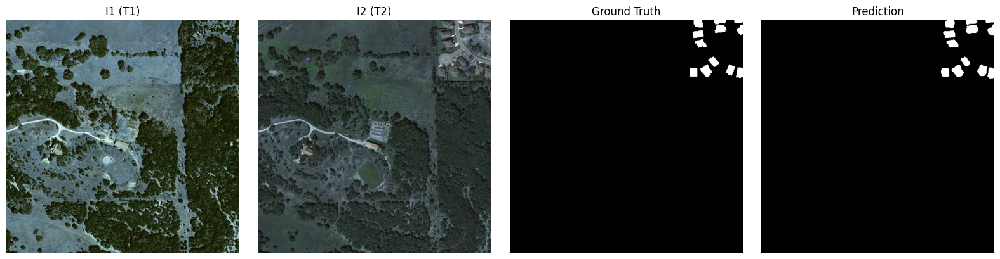

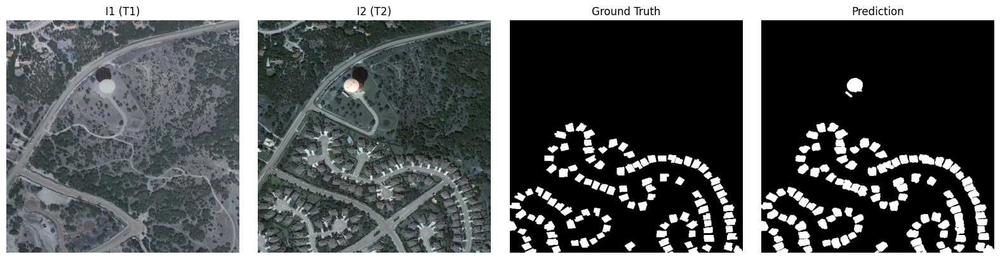

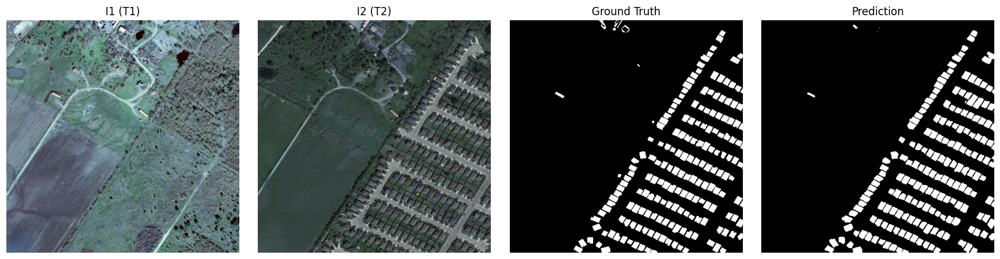

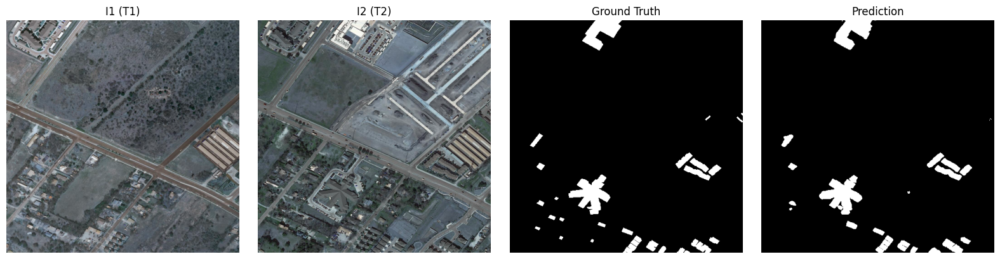

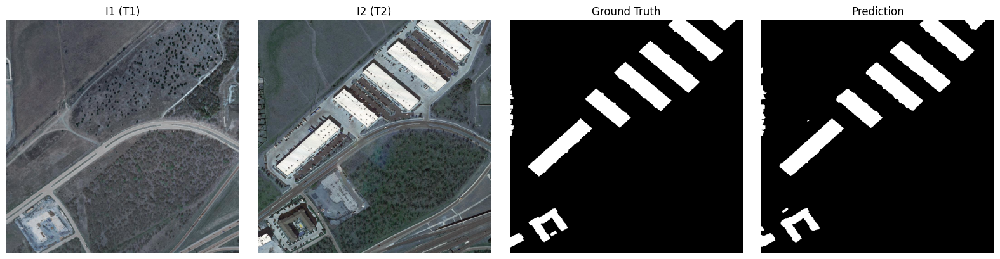

...

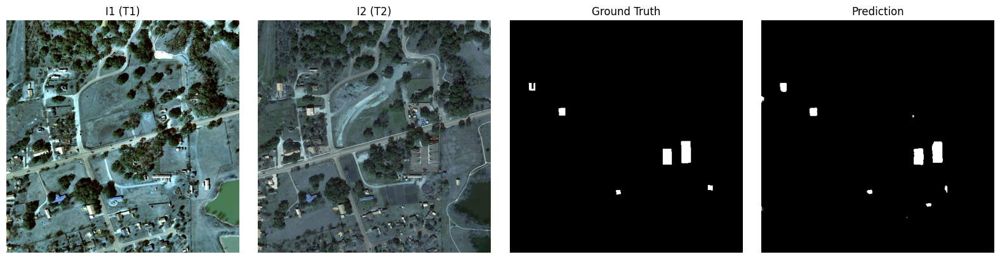

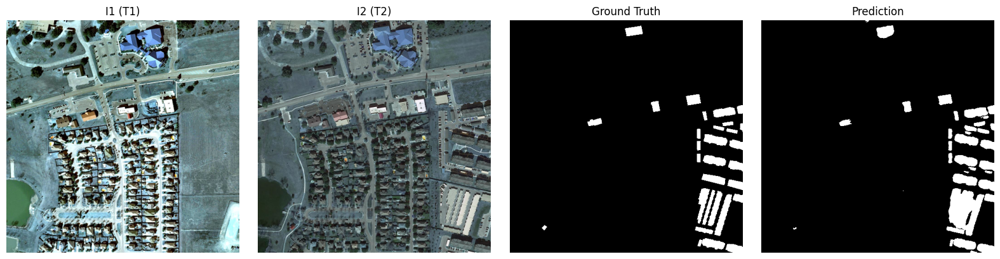

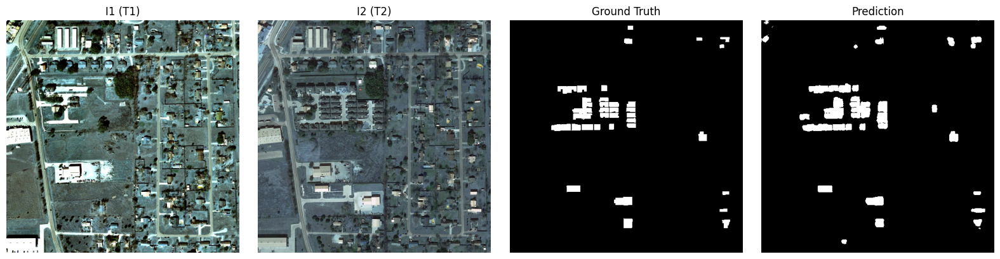

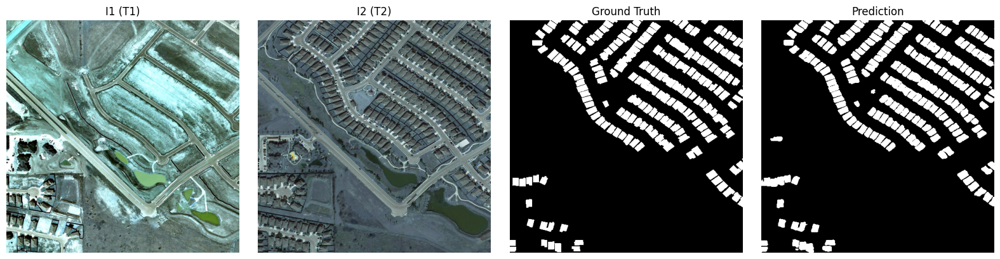

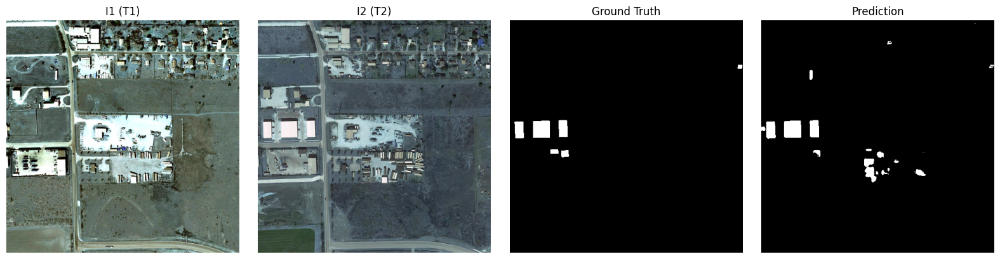

In [ ]:

def visualize_predictions(X1, X2, y_true, y_pred, num_samples=5):
    y_true_labels = np.argmax(y_true, axis=-1)
    y_pred_labels = np.argmax(y_pred, axis=-1)

    for i in range(num_samples):
        fig, axs = plt.subplots(1, 4, figsize=(16, 4))
        
        img1 = (X1_val[i] * 255).astype(np.uint8)
        img2 = (X2_val[i] * 255).astype(np.uint8)

        axs[0].imshow(img1)
        axs[0].set_title("I1 (T1)")

        axs[1].imshow(img2)
        axs[1].set_title("I2 (T2)")

        axs[2].imshow(y_true_labels[i], cmap='gray')
        axs[2].set_title("Ground Truth")

        axs[3].imshow(y_pred_labels[i], cmap='gray')
        axs[3].set_title("Prediction")

        for ax in axs:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

print("X1 range:", X1_val[0].min(), X1_val[0].max(), "dtype:", X1_val.dtype)
preds = model.predict([X1_val, X2_val])

visualize_predictions(X1_val, X2_val, y_val, preds, num_samples=20)


In [ ]:
preds = model.predict([X1_test, X2_test])
y_true = y_test[..., 1]             
y_test_bin = (preds[..., 1] > 0.65)    

y_true_flat = y_true.flatten()
y_pred_flat = y_test_bin.flatten()

TP = np.sum((y_true_flat == 1) & (y_pred_flat == 1))
TN = np.sum((y_true_flat == 0) & (y_pred_flat == 0))
FP = np.sum((y_true_flat == 0) & (y_pred_flat == 1))
FN = np.sum((y_true_flat == 1) & (y_pred_flat == 0))

accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1 = 2 * precision * recall / (precision + recall + 1e-8)
iou = TP / (TP + FP + FN + 1e-8)

total = TP + TN + FP + FN
po = (TP + TN) / total
p_yes = ((TP + FP) / total) * ((TP + FN) / total)
p_no = ((TN + FN) / total) * ((TN + FP) / total)
pe = p_yes + p_no
kappa = (po - pe) / (1 - pe + 1e-8)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"IoU: {iou:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")


Accuracy: 0.9885
Precision: 0.8624
Recall: 0.9300
F1 Score: 0.8949
IoU: 0.8098
Cohen's Kappa: 0.8889


In [ ]:
preds = model.predict([X1_test, X2_test])
y_true = y_test[..., 1]              
y_test_bin = (preds[..., 1] > 0.7)  

y_true_flat = y_true.flatten()
y_pred_flat = y_test_bin.flatten()

TP = np.sum((y_true_flat == 1) & (y_pred_flat == 1))
TN = np.sum((y_true_flat == 0) & (y_pred_flat == 0))
FP = np.sum((y_true_flat == 0) & (y_pred_flat == 1))
FN = np.sum((y_true_flat == 1) & (y_pred_flat == 0))

accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1 = 2 * precision * recall / (precision + recall + 1e-8)
iou = TP / (TP + FP + FN + 1e-8)

total = TP + TN + FP + FN
po = (TP + TN) / total
p_yes = ((TP + FP) / total) * ((TP + FN) / total)
p_no = ((TN + FN) / total) * ((TN + FP) / total)
pe = p_yes + p_no
kappa = (po - pe) / (1 - pe + 1e-8)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"IoU: {iou:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")


Accuracy: 0.9890
Precision: 0.8750
Recall: 0.9221
F1 Score: 0.8979
IoU: 0.8148
Cohen's Kappa: 0.8921
